# Label_Generation_QC_v1

**Goal:** Generate and visually verify clean 4-class training labels from scratch, before any patch generation or model training.

**Fresh-start architecture** (legacy debt from v6/v7/v8 shed):

| Stage | Output |
|---|---|
| Droplet detection | NPC watershed (histogram-clipped) → distance-transform markers → 10 px erosion |
| Nucleus detection | Adaptive threshold within droplet → per-droplet Otsu fallback → may be empty |
| NPC puncta | Nucleus-boundary-relative annular zone (raw, unclipped NPC) |
| Label representation | 4-channel **multi-label** binary stack (classes overlap) |

| Dim order | `(T, Z, C, Y, X)` |
|---|---|
| Channels | `C=0 Membrane · C=1 NLS · C=2 NPC` |
| Classes | `0 Background · 1 Droplet · 2 NPC · 3 Nucleus` |

In [6]:
from pathlib import Path
print(Path.cwd())


/home/tdeibert/Projects


In [7]:
import sys
from pathlib import Path

# Anchor to a known marker by searching both up and down from cwd
def find_repo_root(marker="paths_config.py"):
    start = Path.cwd()
    # search upward
    p = start
    while True:
        if (p / marker).exists():
            return p
        if p == p.parent:
            break
        p = p.parent
    # search downward
    for candidate in start.rglob(marker):
        return candidate.parent
    raise FileNotFoundError(f"Could not find {marker} up or down from {start}")

REPO_ROOT = find_repo_root()
sys.path.insert(0, str(REPO_ROOT))

from paths_config import paths, ENV
paths.make_all()
print(paths.summary())

Environment : LOCAL

  ✓  project_root        /home/tdeibert/Projects/Nuclear_Scaling/Code_Repository
  ✓  scratch_root        /home/tdeibert/Projects/Nuclear_Scaling/Code_Repository/_scratch
  ✓  raw_data            /home/tdeibert/Projects/Nuclear_Scaling/Code_Repository/data/raw
  ✓  labels              /home/tdeibert/Projects/Nuclear_Scaling/Code_Repository/data/labels
  ✓  label_qc            /home/tdeibert/Projects/Nuclear_Scaling/Code_Repository/data/label_qc
  ✓  figures             /home/tdeibert/Projects/Nuclear_Scaling/Code_Repository/figures
  ✓  patches             /home/tdeibert/Projects/Nuclear_Scaling/Code_Repository/_scratch/patches
  ✓  checkpoints         /home/tdeibert/Projects/Nuclear_Scaling/Code_Repository/_scratch/checkpoints
  ✓  logs                /home/tdeibert/Projects/Nuclear_Scaling/Code_Repository/_scratch/logs
  ✓  inference           /home/tdeibert/Projects/Nuclear_Scaling/Code_Repository/_scratch/inference


In [8]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import tifffile
from pathlib import Path

from skimage import filters, morphology, segmentation, measure
from skimage.feature import peak_local_max
from scipy import ndimage

rng = np.random.default_rng(42)  # deterministic sampling for QC displays

In [9]:
# ── Paths ─────────────────────────────────────────────────────────────────────
# ── Paths (via paths_config) ─────────────────────────────────────
HYPERSTACK_PATH = Path("/home/tdeibert/Data/Machine_Learning_Dev/Images/control_extract_1.1.tif")
OUTPUT_DIR      = paths.patches                                # scratch

# ── Channel indices  (T, Z, C, Y, X) ──────────────────────────────────────────
CH_MEMBRANE = 0
CH_NLS      = 1
CH_NPC      = 2

# ── 4-class scheme (multi-label: channels may overlap) ─────────────────────────
CLASS_BACKGROUND = 0
CLASS_DROPLET    = 1
CLASS_NPC        = 2
CLASS_NUCLEUS    = 3
CLASS_NAMES      = ["Background", "Droplet", "NPC", "Nucleus"]

# ── Calibration (control_extract_1.1.tif, carried over from v7) ────────────────
PIXEL_UM = 0.108                       # µm / px  (50,000 px ≈ 583 µm²)
def um2_to_px(um2): return um2 / (PIXEL_UM ** 2)

# ── Droplet detection — NPC watershed ──────────────────────────────────────────
# Histogram clip is applied to a COPY of the NPC plane ONLY for droplet detection.
# It suppresses bright NPC puncta so they cannot fragment the watershed.
# The raw NPC channel is re-pulled fresh for NPC puncta detection (see Stage 3).
NPC_CLIP_LO_PCT   = 1.0     # lower clip percentile
NPC_CLIP_HI_PCT   = 80.0    # upper clip percentile (v7 used p1–p80)
BLUR_SIGMA        = 8.0     # Gaussian blur on clipped image (v7 calibration)
ADAPTIVE_BLOCK    = 301     # local-threshold block size for droplet foreground (odd)
ADAPTIVE_OFFSET   = -0.05   # local-threshold offset (v7 calibration)
MIN_PEAK_DISTANCE = 40      # min px between watershed seeds  ← KEY tuning knob
MIN_DROPLET_AREA  = um2_to_px(150)   # ≈ 12,860 px ; reject small debris
DROPLET_MIN_CIRC  = 0.70    # reject merged / kidney-bean regions (v7)
EROSION_PX        = 10       # erode each watershed region edge inward (v7)

# ── NPC puncta — nucleus-boundary-relative ─────────────────────────────────────
NPC_MARGIN_PX = 5      # half-width of annular zone straddling the nucleus edge
NPC_STD_MULT  = 2.0    # threshold = mean + NPC_STD_MULT*std of RAW NPC interior (v7)

# ── Nucleus — adaptive with Otsu fallback ──────────────────────────────────────
NUCLEUS_BLOCK_SIZE   = None    # None = auto (~1/3 droplet diameter, forced odd)
NUCLEUS_MIN_FRACTION = 0.01    # below → treat as no nucleus (early timepoints)
NUCLEUS_MAX_FRACTION = 0.50    # above → threshold ran away (v7 max_droplet_fraction)
NUCLEUS_MIN_CIRC     = 0.40    # circularity gate (v7)

# ── Patch generation ───────────────────────────────────────────────────────────
PATCH_SIZE = 512
Z_FLOOR    = 6     # exclude coverslip-artifact planes below this z
N_PREVIEW  = 10    # patches to spot-check in Stage 5

In [10]:
def load_hyperstack(path: Path):
    """Memory-map the hyperstack as (T, Z, C, Y, X) — planes read lazily from disk."""
    try:
        hs = tifffile.memmap(str(path), mode="r")
    except (ValueError, MemoryError) as e:
        # memmap needs an uncompressed, contiguous TIFF; fall back to lazy zarr
        print(f"memmap unavailable ({e}); opening as lazy zarr store")
        import zarr
        hs = zarr.open(tifffile.imread(str(path), aszarr=True), mode="r")
    assert hs.ndim == 5, f"Expected 5D (T,Z,C,Y,X), got {hs.ndim}D: {hs.shape}"
    print(f"Loaded (lazy): shape={hs.shape}  dtype={hs.dtype}")
    return hs


hyperstack = load_hyperstack(HYPERSTACK_PATH)
T, Z, C, Y, X = hyperstack.shape
print(f"T={T}  Z={Z}  C={C}  Y={Y}  X={X}")

Loaded (lazy): shape=(10, 20, 3, 3889, 5732)  dtype=>u2
T=10  Z=20  C=3  Y=3889  X=5732


---
## Methodology review — issues checked & decisions

Four potential methodology problems were identified and addressed in this design. Read before running.

### 1. Histogram isolation (the core fix)
The NPC channel is used for **two different purposes** with **opposite** intensity requirements:

| Purpose | Needs | Treatment |
|---|---|---|
| Droplet detection | puncta *suppressed* so they don't fragment the watershed | clip p1–p80 |
| NPC puncta detection | puncta *preserved* — they are the signal | **raw, unclipped** |

If a single clipped array were shared between both steps, NPC detection would read a signal with its puncta already clamped away — silently destroying the exact class it is trying to label. This is a plausible root cause of the total NPC failure you saw.

**Enforcement:** every channel access goes through `extract_plane()`, which returns a fresh `float32` **copy** pulled from the original hyperstack. `clip_histogram()` never writes in place. Droplet detection clips its own local copy; NPC detection re-pulls the raw plane. A QC cell below asserts the source hyperstack is byte-for-byte unchanged after a full detection pass.

### 2. Label representation — multi-label, not integer
Your label diagnostic shows four overlapping binary channels (the nucleus footprint also belongs to the droplet). A single integer plane with paint-order overwrite would erase the droplet class under every nucleus. Labels are therefore stored as a `(4, H, W)` binary stack where channels overlap. `collapse_to_integer()` is provided if you later want an argmax map for a softmax head — **confirm which your model expects.**

### 3. NPC detection requires a detected nucleus
NPC puncta are anchored to the nucleus boundary (your choice). Consequence: at early timepoints with NPC puncta but no sealed NLS-positive nucleus, no NPC will be labeled. Acceptable if confirmed-nucleus NPC is the training target — **flag if you need pre-nucleus NPC.**

### 4. Both watershed failure modes
- *Non-uniform interiors* (Image 1): each droplet region is `binary_fill_holes`-ed before erosion → solid class 1.
- *Internal structures labeled instead of boundary* (Image 2): markers come from the **distance transform of the clipped binary foreground** (shape), never from intensity, so an internal NPC ring cannot seed a basin. A circularity gate rejects merged blobs.

In [11]:
# ── Histogram-safe channel access ──────────────────────────────────────────────
# These two functions are the guarantee behind methodology point #1.
# Nothing downstream is permitted to mutate the hyperstack in place.

def extract_plane(hyperstack: np.ndarray, t: int, z: int, c: int) -> np.ndarray:
    """
    Return a single 2D plane as a fresh float32 COPY.

    Always a copy: callers may clip/blur/threshold the result freely without
    ever touching the source hyperstack or any other class's view of the channel.
    """
    return np.asarray(hyperstack[t, z, c], dtype=np.float32).copy()


def clip_histogram(img: np.ndarray, lo_pct: float, hi_pct: float) -> np.ndarray:
    """
    Percentile-clip and 0–1 normalise a COPY of `img`. Never writes in place.

    Used ONLY for droplet detection to suppress NPC puncta. The returned array
    is a new object; `img` is unchanged.
    """
    work = img.astype(np.float32, copy=True)
    lo, hi = np.percentile(work, [lo_pct, hi_pct])
    work = np.clip(work, lo, hi)
    rng_ = hi - lo
    if rng_ <= 0:
        return np.zeros_like(work)
    return (work - lo) / rng_


def _circularity(region) -> float:
    """4*pi*area / perimeter^2. Returns 0 for degenerate perimeter."""
    p = region.perimeter
    if p <= 0:
        return 0.0
    return float(4.0 * np.pi * region.area / (p * p))

In [12]:
# ── Histogram-isolation QC ─────────────────────────────────────────────────────
# Proves a full detection pass leaves the source channel untouched. Run anytime.

def assert_histogram_isolation(hyperstack: np.ndarray, t: int, z: int) -> None:
    before = hyperstack[t, z, CH_NPC].copy()

    raw      = extract_plane(hyperstack, t, z, CH_NPC)
    _clipped = clip_histogram(raw, NPC_CLIP_LO_PCT, NPC_CLIP_HI_PCT)  # for droplets
    raw_again = extract_plane(hyperstack, t, z, CH_NPC)               # for NPC puncta

    after = hyperstack[t, z, CH_NPC]
    assert np.array_equal(before, after), "SOURCE MUTATED — histogram bled across classes!"
    assert np.array_equal(raw, raw_again), "Re-pulled raw plane differs — copy failure!"
    assert not np.array_equal(_clipped, raw / (raw.max() + 1e-8)), "Clip had no effect?"
    print("Histogram isolation OK: source unchanged; raw NPC re-pull is identical & unclipped.")


assert_histogram_isolation(hyperstack, t=min(4, T - 1), z=min(8, Z - 1))

Histogram isolation OK: source unchanged; raw NPC re-pull is identical & unclipped.


---
## Stage 1 — Core detection functions & single-droplet audit

Four core functions, then a single-droplet audit to confirm class assignment before any scale-up.

In [13]:
def detect_droplets_npc_watershed(
    npc_plane: np.ndarray,
    clip_lo: float = NPC_CLIP_LO_PCT,
    clip_hi: float = NPC_CLIP_HI_PCT,
    blur_sigma: float = BLUR_SIGMA,
    block_size: int = ADAPTIVE_BLOCK,
    offset: float = ADAPTIVE_OFFSET,
    min_peak_distance: int = MIN_PEAK_DISTANCE,
    min_area: float = MIN_DROPLET_AREA,
    min_circ: float = DROPLET_MIN_CIRC,
    erosion_px: int = EROSION_PX,
) -> list[dict]:
    """
    Detect individual droplets from one NPC plane.

    Pipeline
    --------
    1. clip_histogram (p1–p80) on a COPY → suppresses bright puncta.
    2. Gaussian blur (sigma=8).
    3. Local adaptive threshold (block=301, offset=-0.05) → binary foreground.
    4. Clean: fill holes + remove small objects.
    5. Distance transform of the binary mask → peak_local_max seeds (SHAPE-based,
       immune to internal NPC intensity structure).
    6. Watershed on -distance, masked to foreground → separates touching droplets.
    7. Per region: fill holes, circularity + area gates, erode `erosion_px` inward.

    Returns
    -------
    list[dict]: {label, mask(bool YX, eroded+filled), bbox, centroid, area, circ}
    """
    img_norm = clip_histogram(npc_plane, clip_lo, clip_hi)           # copy, safe
    img_blur = filters.gaussian(img_norm, sigma=blur_sigma)

    local_thresh = filters.threshold_local(img_blur, block_size=block_size, offset=offset)
    fg = img_blur > local_thresh
    fg = ndimage.binary_fill_holes(fg)
    fg = morphology.remove_small_objects(fg, min_size=int(min_area))

    dist = ndimage.distance_transform_edt(fg)
    seeds = peak_local_max(dist, min_distance=min_peak_distance, labels=fg)
    markers = np.zeros(dist.shape, dtype=np.int32)
    for i, (r, c) in enumerate(seeds, start=1):
        markers[r, c] = i
    if markers.max() == 0:
        return []

    ws = segmentation.watershed(-dist, markers, mask=fg)

    droplets = []
    selem = morphology.disk(erosion_px)
    for region in measure.regionprops(ws):
        if region.area < min_area:
            continue
        circ = _circularity(region)
        if circ < min_circ:
            continue                                   # rejects merged/kidney shapes
        region_mask = ndimage.binary_fill_holes(ws == region.label)  # solid interior
        eroded = morphology.binary_erosion(region_mask, selem)       # 10 px inward
        if not eroded.any():
            continue
        ys, xs = np.where(eroded)
        droplets.append({
            "label":    int(region.label),
            "mask":     eroded,
            "bbox":     (int(ys.min()), int(xs.min()), int(ys.max()) + 1, int(xs.max()) + 1),
            "centroid": (float(ys.mean()), float(xs.mean())),
            "area":     int(eroded.sum()),
            "circ":     round(circ, 3),
        })
    return droplets

In [14]:
def detect_nucleus_adaptive(
    nls_crop: np.ndarray,
    droplet_mask_crop: np.ndarray,
    block_size: int | None = NUCLEUS_BLOCK_SIZE,
    min_frac: float = NUCLEUS_MIN_FRACTION,
    max_frac: float = NUCLEUS_MAX_FRACTION,
    min_circ: float = NUCLEUS_MIN_CIRC,
) -> tuple[np.ndarray, str]:
    """
    Detect the nucleus interior from the NLS crop of one droplet.

    Primary: adaptive local threshold within the droplet mask.
    Fallback: per-droplet Otsu on NLS values inside the droplet.
    If neither passes the area + circularity gates → return an EMPTY mask, "none"
    (biologically correct for early timepoints with no sealed nucleus — we do not
    hallucinate a nucleus to satisfy a minimum).

    Returns (nucleus_mask bool, method in {"adaptive","otsu","none"}).
    """
    nls = nls_crop.astype(np.float32, copy=True)
    droplet_area = int(droplet_mask_crop.sum())
    empty = np.zeros_like(droplet_mask_crop, dtype=bool)
    if droplet_area == 0:
        return empty, "none"

    diameter = 2.0 * np.sqrt(droplet_area / np.pi)
    if block_size is None:
        bs = max(3, int(diameter / 3))
        bs = bs + 1 if bs % 2 == 0 else bs
    else:
        bs = block_size

    def _clean_and_gate(mask):
        mask = mask & droplet_mask_crop
        mask = morphology.remove_small_objects(mask, min_size=64)
        mask = ndimage.binary_fill_holes(mask)
        frac = mask.sum() / droplet_area
        if not (min_frac <= frac <= max_frac):
            return None
        lbl = measure.label(mask)
        props = measure.regionprops(lbl)
        if not props:
            return None
        biggest = max(props, key=lambda r: r.area)
        if _circularity(biggest) < min_circ:
            return None
        return lbl == biggest.label   # keep single largest nucleus

    # primary — adaptive
    try:
        local_t = filters.threshold_local(nls, block_size=bs)
        cand = _clean_and_gate(nls > local_t)
        if cand is not None:
            return cand, "adaptive"
    except Exception:
        pass

    # fallback — Otsu on interior values
    try:
        vals = nls[droplet_mask_crop]
        if vals.size and vals.max() > vals.min():
            cand = _clean_and_gate(nls > filters.threshold_otsu(vals))
            if cand is not None:
                return cand, "otsu"
    except Exception:
        pass

    return empty, "none"

In [15]:
def detect_npc_puncta(
    npc_crop_raw: np.ndarray,
    nucleus_mask_crop: np.ndarray,
    droplet_mask_crop: np.ndarray,
    margin_px: int = NPC_MARGIN_PX,
    std_mult: float = NPC_STD_MULT,
) -> np.ndarray:
    """
    Detect NPC puncta using the nucleus boundary as the spatial anchor.

    `npc_crop_raw` MUST be the raw, unclipped NPC plane (re-pulled via
    extract_plane), NOT the clipped array used for droplet detection — otherwise
    the puncta signal is gone. This is methodology point #1.

    Strategy
    --------
    - Annular search zone straddling the nucleus edge:
          outer = dilate(nucleus, margin_px); inner = erode(nucleus, margin_px)
          zone  = outer & ~inner
      Excludes the nucleus interior (antibody-diffusion artifact) and the droplet
      wall (v6-era error) by construction.
    - Threshold = mean + std_mult*std of RAW NPC over the droplet interior (v7).
    - Puncta = (npc > threshold) within the zone.

    Returns NPC puncta mask (bool, crop coords). Empty if no nucleus to anchor to.
    """
    if nucleus_mask_crop.sum() == 0:
        return np.zeros_like(nucleus_mask_crop, dtype=bool)

    npc = npc_crop_raw.astype(np.float32, copy=True)
    selem = morphology.disk(margin_px)
    outer = morphology.binary_dilation(nucleus_mask_crop, selem)
    inner = morphology.binary_erosion(nucleus_mask_crop, selem)
    zone = outer & ~inner

    interior_vals = npc[droplet_mask_crop]
    if interior_vals.size == 0:
        return np.zeros_like(nucleus_mask_crop, dtype=bool)
    thresh = interior_vals.mean() + std_mult * interior_vals.std()

    return (npc > thresh) & zone

In [16]:
def build_label_stack(
    shape: tuple,
    droplets: list[dict],
    nucleus_masks: list[np.ndarray],
    npc_masks: list[np.ndarray],
) -> np.ndarray:
    """
    Compose a 4-channel MULTI-LABEL binary stack (channels may overlap).

        ch0 Background = NOT droplet
        ch1 Droplet    = solid eroded droplet interior (INCLUDES nucleus footprint)
        ch2 NPC        = puncta on the nuclear envelope
        ch3 Nucleus    = nucleus interior

    Matches the per-channel label diagnostic (droplet solid, nucleus a subset of it).
    Returns uint8 array (4, H, W).
    """
    H, W = shape
    droplet = np.zeros((H, W), bool)
    npc     = np.zeros((H, W), bool)
    nucleus = np.zeros((H, W), bool)

    for d, nuc, npcm in zip(droplets, nucleus_masks, npc_masks):
        droplet |= d["mask"]
        r0, c0, r1, c1 = d["bbox"]
        nucleus[r0:r1, c0:c1] |= nuc
        npc[r0:r1, c0:c1] |= npcm

    droplet |= nucleus          # nucleus lies inside the droplet → droplet is solid
    background = ~droplet
    return np.stack([background, droplet, npc, nucleus]).astype(np.uint8)


def collapse_to_integer(label_stack: np.ndarray) -> np.ndarray:
    """
    Collapse the multi-label stack to a single integer map for a softmax head.
    Priority (highest wins): Nucleus > NPC > Droplet > Background.
    Use ONLY if your model expects mutually-exclusive classes — confirm first.
    """
    _, H, W = label_stack.shape
    out = np.zeros((H, W), dtype=np.uint8)
    out[label_stack[CLASS_DROPLET].astype(bool)]  = CLASS_DROPLET
    out[label_stack[CLASS_NPC].astype(bool)]      = CLASS_NPC
    out[label_stack[CLASS_NUCLEUS].astype(bool)]  = CLASS_NUCLEUS
    return out

In [17]:
_LABEL_CMAP = ListedColormap(["#2d004b", "#1f78b4", "#ffd700", "#1b7837"])  # bg/drop/npc/nuc

def _norm(img):
    lo, hi = np.percentile(img, [1, 99])
    return np.clip((img - lo) / (hi - lo + 1e-8), 0, 1)


def audit_single_droplet(hyperstack, t: int, z: int, droplet_idx: int = 0) -> None:
    """
    STAGE 1 — run the full pipeline on one droplet and render a diagnostic.
    Row 1: raw NLS / NPC / Membrane (full plane, droplet boxed).
    Row 2: droplet mask / nucleus mask / NPC mask / 4-class label (crop).
    """
    nls = extract_plane(hyperstack, t, z, CH_NLS)
    npc = extract_plane(hyperstack, t, z, CH_NPC)   # raw — re-pulled for puncta
    mem = extract_plane(hyperstack, t, z, CH_MEMBRANE)

    droplets = detect_droplets_npc_watershed(npc)
    if not droplets:
        print(f"No droplets detected at t={t}, z={z}.")
        return
    droplets.sort(key=lambda d: d["area"], reverse=True)
    d = droplets[min(droplet_idx, len(droplets) - 1)]
    r0, c0, r1, c1 = d["bbox"]

    dm_crop  = d["mask"][r0:r1, c0:c1]
    nls_crop = nls[r0:r1, c0:c1]
    npc_crop = npc[r0:r1, c0:c1]
    nuc_crop, method = detect_nucleus_adaptive(nls_crop, dm_crop)
    npc_mask = detect_npc_puncta(npc_crop, nuc_crop, dm_crop)

    stack = build_label_stack(nls.shape, [d], [nuc_crop], [npc_mask])
    label_int = collapse_to_integer(stack)[r0:r1, c0:c1]

    fig, ax = plt.subplots(2, 4, figsize=(18, 9))
    for a in ax.ravel():
        a.axis("off")
    for col, (img, name) in enumerate([(nls, "Raw NLS"), (npc, "Raw NPC"), (mem, "Raw Membrane")]):
        ax[0, col].imshow(_norm(img), cmap="gray")
        ax[0, col].add_patch(plt.Rectangle((c0, r0), c1 - c0, r1 - r0, ec="red", fc="none", lw=1.5))
        ax[0, col].set_title(name)
    ax[0, 3].set_title(f"t={t} z={z}\ndroplet area={d['area']} circ={d['circ']}\nnucleus={method}")

    ax[1, 0].imshow(dm_crop, cmap="gray");           ax[1, 0].set_title("Droplet mask")
    ax[1, 1].imshow(nuc_crop, cmap="gray");          ax[1, 1].set_title(f"Nucleus ({method})")
    ax[1, 2].imshow(npc_mask, cmap="gray");          ax[1, 2].set_title("NPC puncta")
    ax[1, 3].imshow(label_int, cmap=_LABEL_CMAP, vmin=0, vmax=3); ax[1, 3].set_title("4-class label")
    plt.tight_layout(); plt.show()

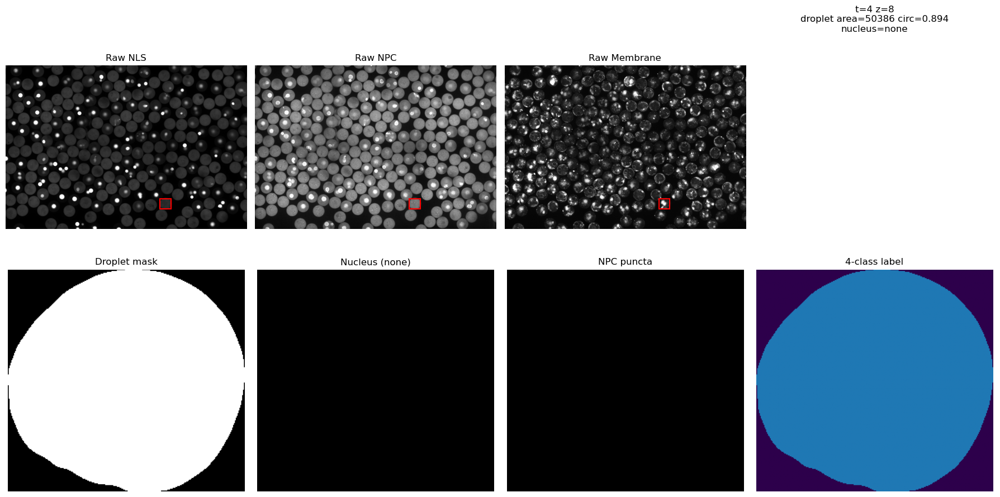

In [18]:
# ── Stage 1 Runner ─────────────────────────────────────────────────────────────
T_AUDIT, Z_AUDIT, IDX_AUDIT = 4, 8, 0   # mid-timecourse, focused plane, largest droplet
audit_single_droplet(hyperstack, t=T_AUDIT, z=Z_AUDIT, droplet_idx=IDX_AUDIT)

159 droplets, 44 nucleated


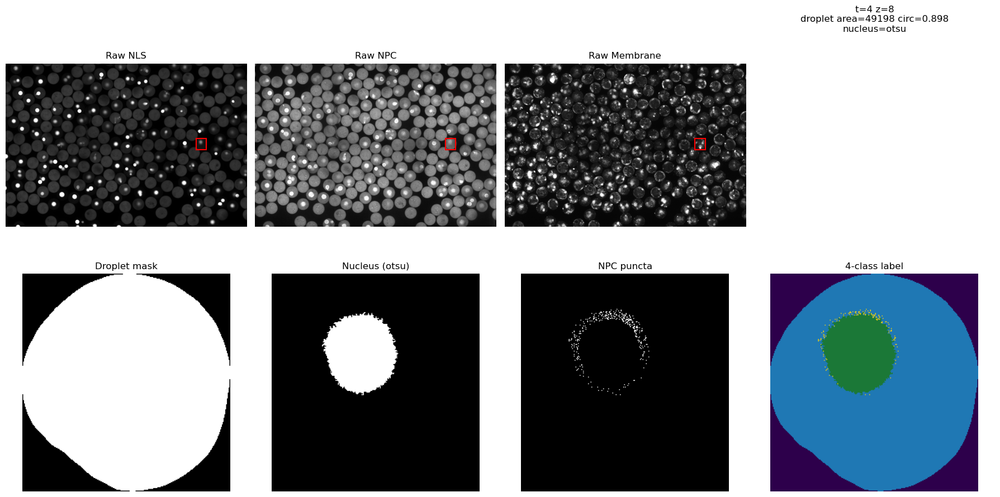

In [19]:
t, z = 4, 8
npc = extract_plane(hyperstack, t, z, CH_NPC)
nls = extract_plane(hyperstack, t, z, CH_NLS)
droplets = detect_droplets_npc_watershed(npc)
droplets.sort(key=lambda d: d["area"], reverse=True)   # same order audit uses

nucleated = []
for i, d in enumerate(droplets):
    r0, c0, r1, c1 = d["bbox"]
    dm = d["mask"][r0:r1, c0:c1]
    nuc, method = detect_nucleus_adaptive(nls[r0:r1, c0:c1], dm)
    if nuc.sum() > 0:
        nucleated.append((i, method, int(nuc.sum())))

print(f"{len(droplets)} droplets, {len(nucleated)} nucleated")
audit_single_droplet(hyperstack, t=t, z=z, droplet_idx=nucleated[0][0])

---
## Stage 2 — Watershed separation validation (dense timepoints)

Each detected region should be ~circular and individually separated. Merged/kidney-bean regions = watershed failure (and are now rejected by the circularity gate, so they show as *uncounted* rather than mislabeled).

In [20]:
def validate_watershed(hyperstack, t_range: list[int], z: int) -> None:
    """STAGE 2 — one row per timepoint: clipped NPC / seeds+watershed / accepted droplets."""
    fig, ax = plt.subplots(len(t_range), 3, figsize=(15, 5 * len(t_range)))
    if len(t_range) == 1:
        ax = ax[None, :]
    for i, t in enumerate(t_range):
        npc = extract_plane(hyperstack, t, z, CH_NPC)
        clipped = clip_histogram(npc, NPC_CLIP_LO_PCT, NPC_CLIP_HI_PCT)
        droplets = detect_droplets_npc_watershed(npc)

        accepted = np.zeros(npc.shape, bool)
        for d in droplets:
            accepted |= d["mask"]

        ax[i, 0].imshow(clipped, cmap="magma");  ax[i, 0].set_title(f"t={t}  clipped NPC (watershed input)")
        ax[i, 1].imshow(_norm(npc), cmap="gray")
        ax[i, 1].imshow(np.ma.masked_where(~accepted, accepted), cmap="autumn", alpha=0.5)
        ax[i, 1].set_title("accepted droplet interiors")
        ax[i, 2].imshow(_norm(npc), cmap="gray")
        for d in droplets:
            cy, cx = d["centroid"]
            ax[i, 2].plot(cx, cy, "c+", ms=10)
        ax[i, 2].set_title(f"{len(droplets)} droplets accepted")
        for a in ax[i]:
            a.axis("off")
    plt.tight_layout(); plt.show()

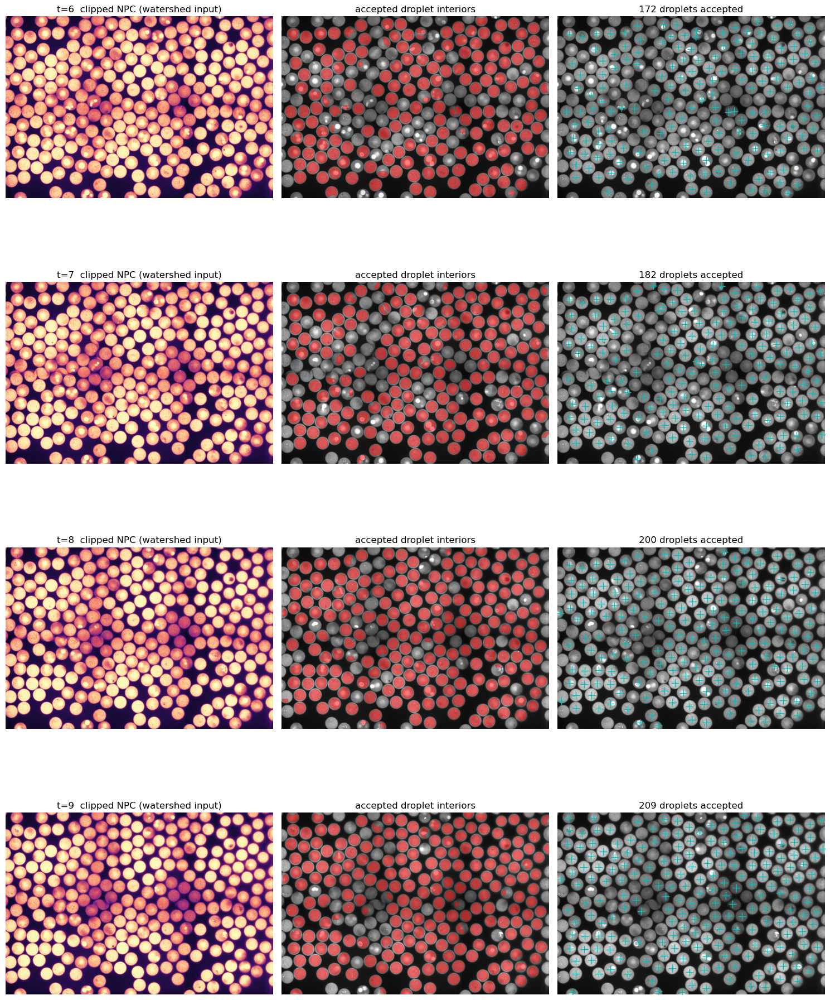

In [21]:
# ── Stage 2 Runner ─────────────────────────────────────────────────────────────
validate_watershed(hyperstack, t_range=list(range(6, min(10, T))), z=8)


# =============================================================================
# STAGE 2.5 — Focus / best-z selection  (timepoint-invariant)
# =============================================================================
# Paste these as new cells after Stage 2. They DEPEND ON the Stage-1 functions
# already defined: extract_plane, clip_histogram, detect_nucleus_adaptive,
# detect_npc_puncta, and the config constants (CH_NLS, CH_NPC, NPC_CLIP_*,
# BLUR_SIGMA, _norm).
#
# Design (validated against true / uniform / pole / eccentric-wall cases):
#   - Droplet extent is RE-SEGMENTED per z from the NPC channel, so it is
#     detectable at every timepoint regardless of NLS import state.
#   - "Focus" = the z that bisects the nucleus at MAX cross-sectional area,
#     chosen as the smoothed argmax of nuc_area over z (robust to single-plane
#     spikes).
#   - A candidate is a real internalized nucleus only if it is CONTAINED:
#     geometric standoff from the per-z droplet wall (distance transform, NOT
#     signal in the gap) >= STANDOFF_MIN_PX. This rejects droplet poles and
#     uniform-fill droplets, both of which extend to the wall, and it does not
#     depend on cytoplasmic NLS being visible — so it holds at late timepoints.
#   - NPC ring presence is required as independent corroboration.
# =============================================================================
 

In [37]:

# ── Focus-gate parameters ─────────────────────────────────────────────────────
STANDOFF_MIN_PX = 5.0    # min geometric gap (px) between nucleus edge and droplet wall
NC_FLOOR        = 1.05   # nucleus must be at least this much brighter than local cytoplasm
AREA_SMOOTH     = 3      # window for smoothing nuc_area(z) before peak selection
 
 
def _droplet_extent_at_z(npc_crop, center_rc,
                         clip_lo=NPC_CLIP_LO_PCT, clip_hi=NPC_CLIP_HI_PCT,
                         blur_sigma=BLUR_SIGMA,
                         block_size=ADAPTIVE_BLOCK, offset=ADAPTIVE_OFFSET,
                         closing_radius_px=12):
    """
    Re-segment THIS droplet's cross-section at one z from the NPC channel.

    Geometry-only: pixel values are NOT preserved. Uses the same shape-based
    pipeline as detect_droplets_npc_watershed (adaptive threshold + vacuole
    closing + fill) instead of global Otsu, so it does NOT latch onto the
    bright nucleus interior at in-focus planes. Returns the connected
    component containing the droplet centre.
    """
    norm = clip_histogram(npc_crop, clip_lo, clip_hi)
    blur = filters.gaussian(norm, blur_sigma)
    if blur.max() <= blur.min():
        return np.zeros(npc_crop.shape, bool)

    # Shape-based foreground (matches watershed detector), NOT global Otsu
    local_thresh = filters.threshold_local(blur, block_size=block_size, offset=offset)
    fg = blur > local_thresh
    fg = morphology.binary_closing(fg, morphology.disk(closing_radius_px))  # bridge vacuole
    fg = ndimage.binary_fill_holes(fg)

    lbl = measure.label(fg)
    cr, cc = center_rc
    cr = min(max(int(round(cr)), 0), lbl.shape[0] - 1)
    cc = min(max(int(round(cc)), 0), lbl.shape[1] - 1)
    cid = lbl[cr, cc]
    if cid == 0:
        props = measure.regionprops(lbl)
        if not props:
            return np.zeros(npc_crop.shape, bool)
        return lbl == max(props, key=lambda r: r.area).label
    return lbl == cid

In [23]:

# ── Visualization ─────────────────────────────────────────────────────────────
def show_z_profile(hyperstack, t, droplet, z_range=None):
    """
    Two-panel diagnostic for one droplet:
      Fig 1 — nuc_area, standoff, and NPC-count vs z, with the selected best_z
              marked and the STANDOFF_MIN_PX floor drawn.
      Fig 2 — montage of NLS crops across z with nucleus (cyan) and per-z droplet
              (red) outlines; the chosen focus plane is boxed.
    """
    prof, best_z, valid = profile_droplet_through_z(hyperstack, t, droplet, z_range)
    z = prof["z"].astype(int)
 
    fig, ax = plt.subplots(3, 1, figsize=(10, 7), sharex=True)
    ax[0].plot(z, prof["nuc_area"], "o-"); ax[0].set_ylabel("nucleus area (px)")
    ax[1].plot(z, prof["standoff"], "o-"); ax[1].axhline(STANDOFF_MIN_PX, color="r", ls="--", lw=1)
    ax[1].set_ylabel("standoff (px)")
    ax[2].plot(z, prof["npc"], "o-"); ax[2].set_ylabel("NPC ring (px)"); ax[2].set_xlabel("z")
    title = f"t={t}  best_z={best_z}" if best_z is not None else f"t={t}  NO valid focus plane"
    for a in ax:
        if best_z is not None:
            a.axvline(best_z, color="g", alpha=0.4, lw=2)
    ax[0].set_title(title)
    plt.tight_layout(); plt.show()
 
    r0, c0, r1, c1 = droplet["bbox"]
    ccy, ccx = droplet["centroid"]; center_rc = (ccy - r0, ccx - c0)
    zr = list(range(hyperstack.shape[1])) if z_range is None else list(z_range)
    n = len(zr); cols = min(7, n); rows = int(np.ceil(n / cols))
    fig, ax = plt.subplots(rows, cols, figsize=(2.4 * cols, 2.4 * rows))
    ax = np.atleast_2d(ax)
    for i, zz in enumerate(zr):
        a = ax[i // cols, i % cols]
        nls = extract_plane(hyperstack, t, zz, CH_NLS)[r0:r1, c0:c1]
        npc = extract_plane(hyperstack, t, zz, CH_NPC)[r0:r1, c0:c1]
        drop_z = _droplet_extent_at_z(npc, center_rc)
        nuc, _ = detect_nucleus_adaptive(nls, drop_z)
        a.imshow(_norm(nls), cmap="gray")
        if drop_z.any():
            a.contour(drop_z, levels=[0.5], colors="red", linewidths=0.6)
        if nuc.any():
            a.contour(nuc, levels=[0.5], colors="cyan", linewidths=0.8)
        a.set_title(f"z={zz}" + ("  ★" if zz == best_z else ""), fontsize=8)
        a.axis("off")
        if zz == best_z:
            for s in a.spines.values():
                s.set_visible(True); s.set_color("green"); s.set_linewidth(3)
    for j in range(n, rows * cols):
        ax[j // cols, j % cols].axis("off")
    plt.suptitle("NLS through z — red=droplet(NPC), cyan=nucleus, ★=focus plane")
    plt.tight_layout(); plt.show()
    return prof, best_z, valid

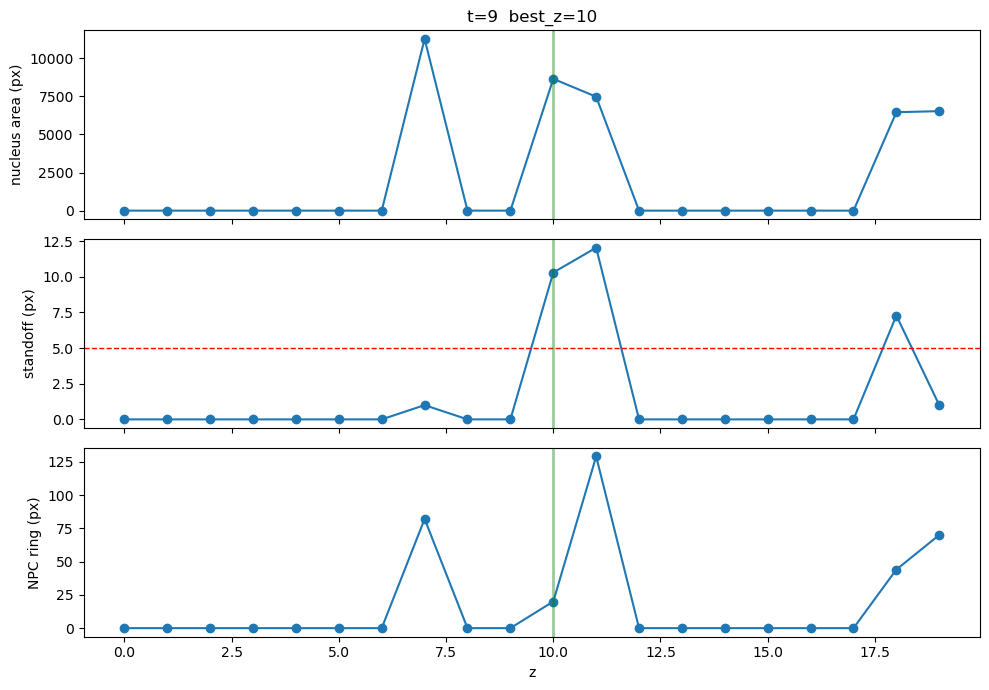

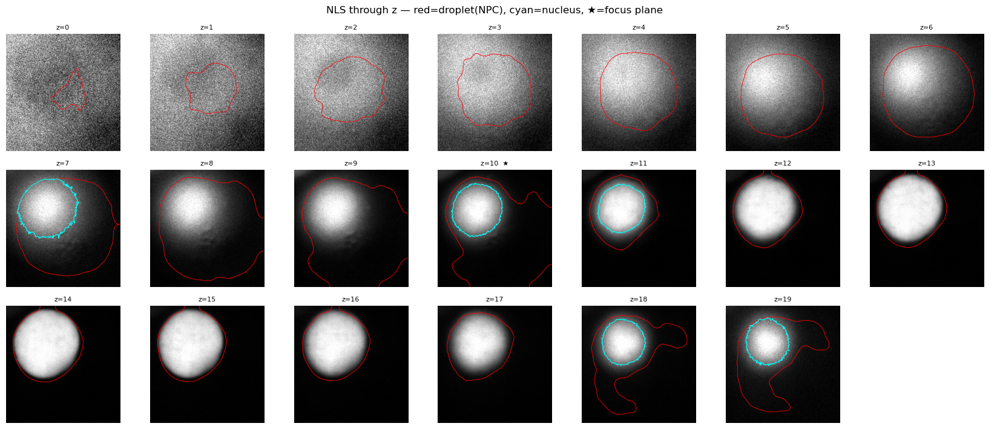

In [38]:
# ── Runner ─────────────────────────────────────────────────────────────────────
# Use the sharpest-nucleus finder to pick a droplet, then profile it through z.
_t, _z_ref = 9, 15
_npc = extract_plane(hyperstack, _t, _z_ref, CH_NPC)
_droplets = detect_droplets_npc_watershed(_npc)
_droplets.sort(key=lambda d: d["area"], reverse=True)
# first nucleated droplet at the reference plane
_target = None
for _d in _droplets:
    _r0, _c0, _r1, _c1 = _d["bbox"]
    _nls = extract_plane(hyperstack, _t, _z_ref, CH_NLS)[_r0:_r1, _c0:_c1]
    _nuc, _ = detect_nucleus_adaptive(_nls, _d["mask"][_r0:_r1, _c0:_c1])
    if _nuc.sum() > 0:
        _target = _d
        break
 
if _target is not None:
    show_z_profile(hyperstack, _t, _target)
else:
    print("No nucleated droplet found at the reference plane; try another (t, z_ref).")

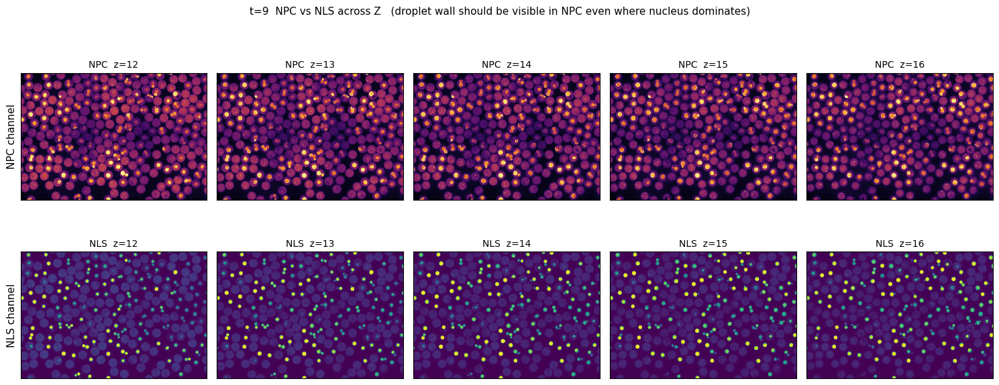

In [39]:
# ============================================================
# Diagnostic — NPC vs NLS overlay across Z for a single droplet
# Verifies whether the true droplet boundary is present in the
# NPC channel at late timepoints while detection latches onto
# the nucleus body instead.
# ============================================================
import numpy as np
import matplotlib.pyplot as plt

# --- Parameters to set ---
T_TEST     = 9          # late timepoint to inspect
Z_RANGE    = range(12, 17)   # focal planes where failure occurs
C_NPC      = 2          # NPC channel index
C_NLS      = 1          # NLS channel index
# Crop around the problem droplet (y0:y1, x0:x1) in full-FOV pixel coords.
# Set to None to view the whole FOV (slow for large images).
CROP = None             # e.g. (1800, 2200, 2400, 2800)

def _norm(img, p_lo=1, p_hi=99):
    """Percentile-stretch for display only."""
    lo, hi = np.percentile(img, [p_lo, p_hi])
    if hi <= lo:
        return np.zeros_like(img, dtype=float)
    return np.clip((img.astype(float) - lo) / (hi - lo), 0, 1)

def overlay_npc_nls(hs, t, z_range, c_npc, c_nls, crop=None):
    z_list = list(z_range)
    n = len(z_list)
    fig, axes = plt.subplots(2, n, figsize=(3 * n, 6.5))
    if n == 1:
        axes = axes.reshape(2, 1)

    for col, z in enumerate(z_list):
        npc = hs[t, z, c_npc]
        nls = hs[t, z, c_nls]
        if crop is not None:
            y0, y1, x0, x1 = crop
            npc = npc[y0:y1, x0:x1]
            nls = nls[y0:y1, x0:x1]

        axes[0, col].imshow(_norm(npc), cmap="magenta" if False else "inferno")
        axes[0, col].set_title(f"NPC  z={z}", fontsize=10)
        axes[1, col].imshow(_norm(nls), cmap="viridis")
        axes[1, col].set_title(f"NLS  z={z}", fontsize=10)
        for r in (0, 1):
            axes[r, col].set_xticks([]); axes[r, col].set_yticks([])

    axes[0, 0].set_ylabel("NPC channel", fontsize=11)
    axes[1, 0].set_ylabel("NLS channel", fontsize=11)
    fig.suptitle(f"t={t}  NPC vs NLS across Z   (droplet wall should be "
                 f"visible in NPC even where nucleus dominates)", fontsize=11)
    plt.tight_layout()
    plt.show()

overlay_npc_nls(hyperstack, T_TEST, Z_RANGE, C_NPC, C_NLS, crop=CROP)

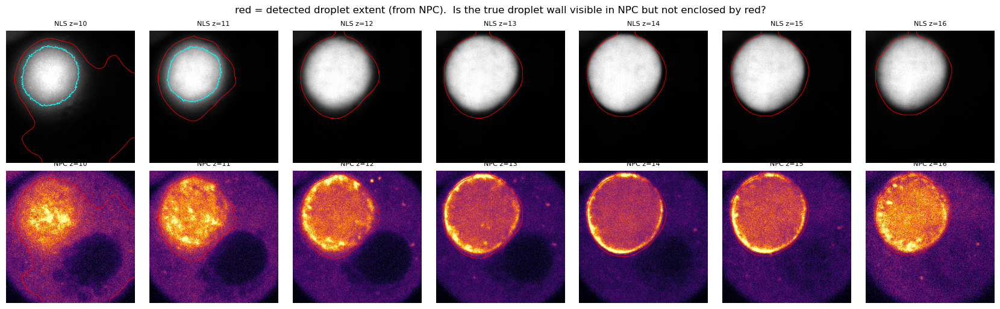

In [40]:
# ============================================================
# Diagnostic — does _droplet_extent_at_z latch onto the nucleus
# at late timepoints?  Shows NLS (top) and NPC (bottom) for one
# droplet across z, with the detected droplet extent (red) and
# nucleus (cyan) drawn on BOTH so you can compare what the NPC
# channel actually contains vs what the detector selected.
# ============================================================
import numpy as np
import matplotlib.pyplot as plt

def audit_droplet_extent(hyperstack, t, droplet, z_range=None):
    r0, c0, r1, c1 = droplet["bbox"]
    ccy, ccx = droplet["centroid"]
    center_rc = (ccy - r0, ccx - c0)
    zr = list(range(hyperstack.shape[1])) if z_range is None else list(z_range)
    n = len(zr)

    fig, ax = plt.subplots(2, n, figsize=(2.4 * n, 5.2))
    ax = np.atleast_2d(ax)

    for i, zz in enumerate(zr):
        nls = extract_plane(hyperstack, t, zz, CH_NLS)[r0:r1, c0:c1]
        npc = extract_plane(hyperstack, t, zz, CH_NPC)[r0:r1, c0:c1]
        drop_z = _droplet_extent_at_z(npc, center_rc)
        nuc, _ = detect_nucleus_adaptive(nls, drop_z)

        # Top row: NLS with overlays
        ax[0, i].imshow(_norm(nls), cmap="gray")
        if drop_z.any():
            ax[0, i].contour(drop_z, levels=[0.5], colors="red", linewidths=0.6)
        if nuc.any():
            ax[0, i].contour(nuc, levels=[0.5], colors="cyan", linewidths=0.8)
        ax[0, i].set_title(f"NLS z={zz}", fontsize=8)
        ax[0, i].axis("off")

        # Bottom row: NPC with the SAME detected droplet extent overlaid
        ax[1, i].imshow(_norm(npc), cmap="inferno")
        if drop_z.any():
            ax[1, i].contour(drop_z, levels=[0.5], colors="red", linewidths=0.6)
        ax[1, i].set_title(f"NPC z={zz}", fontsize=8)
        ax[1, i].axis("off")

    ax[0, 0].set_ylabel("NLS", fontsize=10)
    ax[1, 0].set_ylabel("NPC", fontsize=10)
    plt.suptitle("red = detected droplet extent (from NPC).  "
                 "Is the true droplet wall visible in NPC but not enclosed by red?")
    plt.tight_layout(); plt.show()

# Run against the same droplet/timepoint you were just auditing
audit_droplet_extent(hyperstack, _t, _target, z_range=range(10, 17))


In [41]:
from skimage.morphology import h_maxima

def detect_droplets_npc_watershed(
    npc_plane: np.ndarray,
    clip_lo: float = NPC_CLIP_LO_PCT,
    clip_hi: float = NPC_CLIP_HI_PCT,
    blur_sigma: float = BLUR_SIGMA,
    block_size: int = ADAPTIVE_BLOCK,
    offset: float = ADAPTIVE_OFFSET,
    min_area: float = MIN_DROPLET_AREA,
    min_circ: float = DROPLET_MIN_CIRC,
    erosion_px: int = EROSION_PX,
    closing_radius_px: int = 12,    # NEW — bridges intermittent dark vacuoles
    h_depth: float = 15.0,          # NEW — h_maxima prominence, replaces min_peak_distance
) -> list[dict]:
    """
    Detect individual droplets from one NPC plane.

    Geometry-only path: pixel values are NOT faithfully preserved here.
    This function defines droplet EXTENT. NPC puncta detection must run
    separately on the RAW plane to preserve faithful NPC intensities.
    """
    img_norm = clip_histogram(npc_plane, clip_lo, clip_hi)           # copy, safe
    img_blur = filters.gaussian(img_norm, sigma=blur_sigma)

    local_thresh = filters.threshold_local(img_blur, block_size=block_size, offset=offset)
    fg = img_blur > local_thresh

    # ── NEW: close before filling so an internal dark vacuole that breaks
    #         the foreground gets bridged, then fill_holes sees an enclosed
    #         region. Pure geometry op — sized to span the vacuole.
    fg = morphology.binary_closing(fg, morphology.disk(closing_radius_px))
    fg = ndimage.binary_fill_holes(fg)
    fg = morphology.remove_small_objects(fg, min_size=int(min_area))

    dist = ndimage.distance_transform_edt(fg)

    # ── NEW: h_maxima seeding. Suppresses shallow secondary peaks (nucleus
    #         region / vacuole-displaced maxima) by DEPTH, so one droplet
    #         yields one seed, while two genuinely-touching droplets keep
    #         their two deep distinct maxima.
    maxima = h_maxima(dist, h_depth)
    markers = measure.label(maxima)
    if markers.max() == 0:
        return []

    ws = segmentation.watershed(-dist, markers, mask=fg)

    droplets = []
    selem = morphology.disk(erosion_px)
    for region in measure.regionprops(ws):
        if region.area < min_area:
            continue
        circ = _circularity(region)
        if circ < min_circ:
            continue
        region_mask = ndimage.binary_fill_holes(ws == region.label)
        eroded = morphology.binary_erosion(region_mask, selem)
        if not eroded.any():
            continue
        ys, xs = np.where(eroded)
        droplets.append({
            "label":    int(region.label),
            "mask":     eroded,
            "bbox":     (int(ys.min()), int(xs.min()), int(ys.max()) + 1, int(xs.max()) + 1),
            "centroid": (float(ys.mean()), float(xs.mean())),
            "area":     int(eroded.sum()),
            "circ":     round(circ, 3),
        })
    return droplets

t=9 z=15: detected 172 droplets (closing_r=12, h=15.0)
target droplet: area=45290 circ=0.892 centroid=(677, 4790)


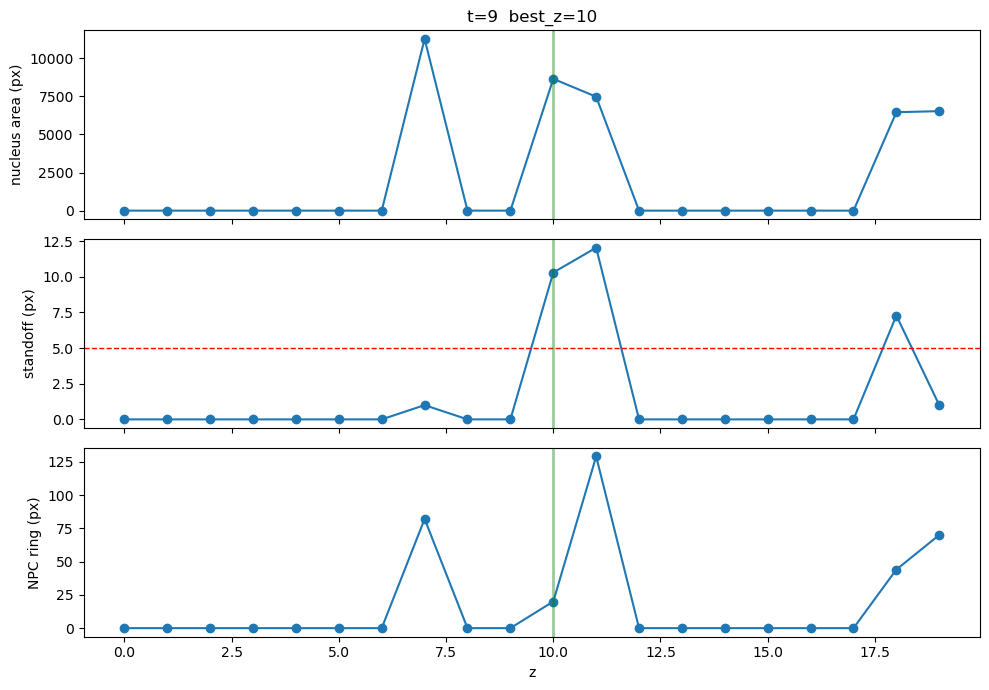

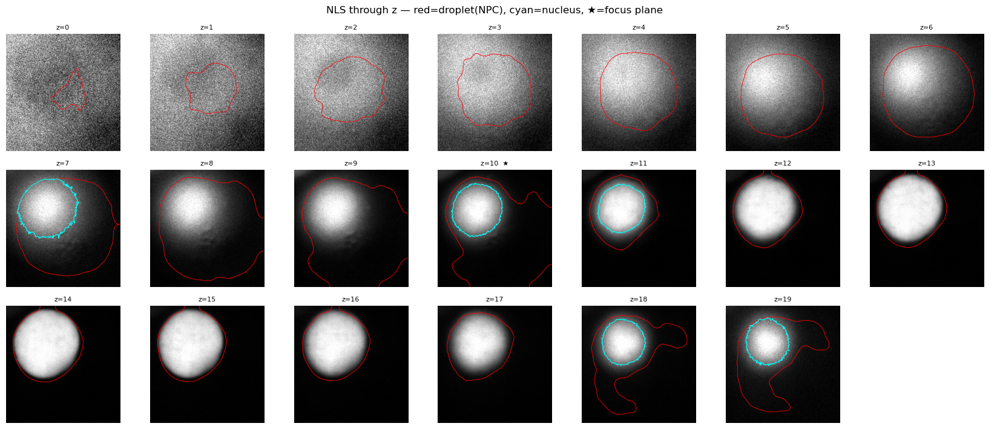

In [42]:
# ── Runner — validate new watershed (h_maxima + vacuole closing) ───────────────
_t, _z_ref = 9, 15          # late timepoint, nucleus-focal reference plane
_npc = extract_plane(hyperstack, _t, _z_ref, CH_NPC)

# Tunable knobs for this pass
_closing_radius_px = 12     # raise if vacuole still splits droplet; lower if droplets merge
_h_depth           = 15.0   # raise if one droplet over-segments; lower if touching droplets merge

_droplets = detect_droplets_npc_watershed(
    _npc,
    closing_radius_px=_closing_radius_px,
    h_depth=_h_depth,
)
_droplets.sort(key=lambda d: d["area"], reverse=True)
print(f"t={_t} z={_z_ref}: detected {len(_droplets)} droplets "
      f"(closing_r={_closing_radius_px}, h={_h_depth})")

# Pick first nucleated droplet at the reference plane
_target = None
for _d in _droplets:
    _r0, _c0, _r1, _c1 = _d["bbox"]
    _nls = extract_plane(hyperstack, _t, _z_ref, CH_NLS)[_r0:_r1, _c0:_c1]
    _nuc, _ = detect_nucleus_adaptive(_nls, _d["mask"][_r0:_r1, _c0:_c1])
    if _nuc.sum() > 0:
        _target = _d
        break

if _target is not None:
    print(f"target droplet: area={_target['area']} circ={_target['circ']} "
          f"centroid={tuple(round(v) for v in _target['centroid'])}")
    show_z_profile(hyperstack, _t, _target)
else:
    print("No nucleated droplet found at the reference plane; try another (t, z_ref).")

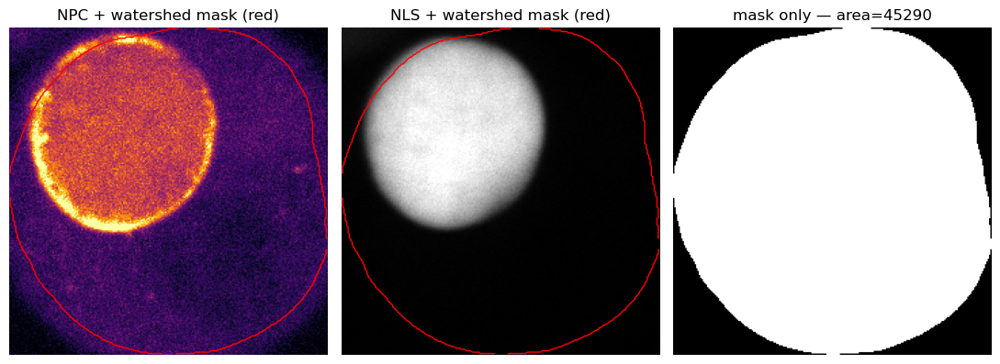

In [36]:
# Isolate the watershed result — does _target["mask"] enclose the FULL droplet?
import matplotlib.pyplot as plt
import numpy as np

_r0, _c0, _r1, _c1 = _target["bbox"]
_npc_crop = extract_plane(hyperstack, _t, _z_ref, CH_NPC)[_r0:_r1, _c0:_c1]
_nls_crop = extract_plane(hyperstack, _t, _z_ref, CH_NLS)[_r0:_r1, _c0:_c1]
_mask_crop = _target["mask"][_r0:_r1, _c0:_c1]

fig, ax = plt.subplots(1, 3, figsize=(11, 4))
ax[0].imshow(_norm(_npc_crop), cmap="inferno")
ax[0].contour(_mask_crop, levels=[0.5], colors="red", linewidths=1.0)
ax[0].set_title("NPC + watershed mask (red)")
ax[1].imshow(_norm(_nls_crop), cmap="gray")
ax[1].contour(_mask_crop, levels=[0.5], colors="red", linewidths=1.0)
ax[1].set_title("NLS + watershed mask (red)")
ax[2].imshow(_mask_crop, cmap="gray")
ax[2].set_title(f"mask only — area={_target['area']}")
for a in ax: a.axis("off")
plt.tight_layout(); plt.show()

crop shape: (242, 235)  bbox: (557, 4670, 799, 4905)


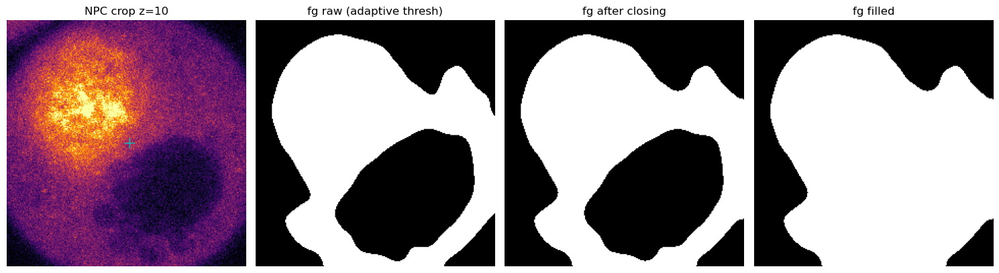

In [43]:
# Debug — what foreground does _droplet_extent_at_z see in the crop?
import matplotlib.pyplot as plt
import numpy as np

_zz = 10  # an in-focus plane where it latches onto nucleus
_r0, _c0, _r1, _c1 = _target["bbox"]
_npc_crop = extract_plane(hyperstack, _t, _zz, CH_NPC)[_r0:_r1, _c0:_c1]
_ccy, _ccx = _target["centroid"]
_center_rc = (_ccy - _r0, _ccx - _c0)

_norm_img = clip_histogram(_npc_crop, NPC_CLIP_LO_PCT, NPC_CLIP_HI_PCT)
_blur = filters.gaussian(_norm_img, BLUR_SIGMA)
_lt = filters.threshold_local(_blur, block_size=ADAPTIVE_BLOCK, offset=ADAPTIVE_OFFSET)
_fg_raw = _blur > _lt
_fg_closed = morphology.binary_closing(_fg_raw, morphology.disk(12))
_fg_filled = ndimage.binary_fill_holes(_fg_closed)

fig, ax = plt.subplots(1, 4, figsize=(15, 4))
ax[0].imshow(_norm(_npc_crop), cmap="inferno"); ax[0].set_title(f"NPC crop z={_zz}")
ax[0].plot(_center_rc[1], _center_rc[0], "c+", markersize=12)
ax[1].imshow(_fg_raw, cmap="gray"); ax[1].set_title("fg raw (adaptive thresh)")
ax[2].imshow(_fg_closed, cmap="gray"); ax[2].set_title("fg after closing")
ax[3].imshow(_fg_filled, cmap="gray"); ax[3].set_title("fg filled")
print(f"crop shape: {_npc_crop.shape}  bbox: {_target['bbox']}")
for a in ax: a.axis("off")
plt.tight_layout(); plt.show()

padded crop: rows 497:859  cols 4610:4965  size 362x355  (pad=60)


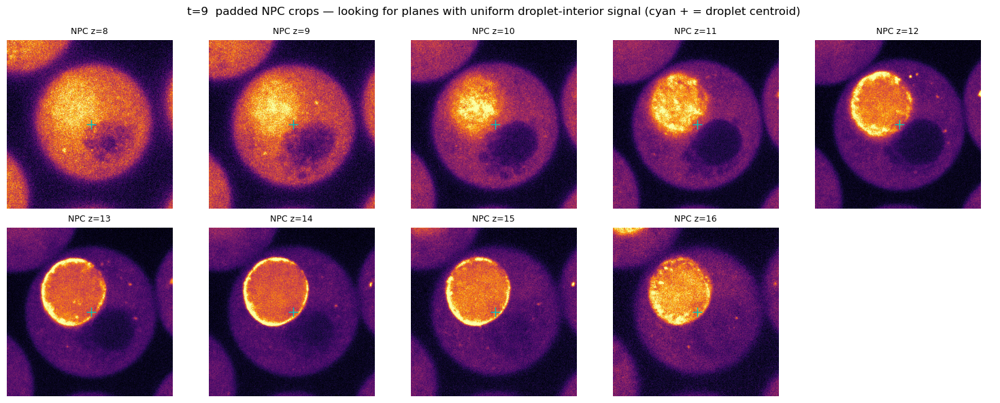

In [44]:
# Wider-pad NPC crop across z to find which planes give uniform droplet signal
import matplotlib.pyplot as plt
import numpy as np

_pad = 60          # pixels of padding beyond the bbox on every side
_z_lo, _z_hi = 8, 17   # inclusive range -> range(8, 17) shows 8..16

_r0, _c0, _r1, _c1 = _target["bbox"]
_H, _W = hyperstack.shape[-2], hyperstack.shape[-1]
_pr0 = max(_r0 - _pad, 0)
_pc0 = max(_c0 - _pad, 0)
_pr1 = min(_r1 + _pad, _H)
_pc1 = min(_c1 + _pad, _W)

# centroid in padded-crop coordinates
_ccy, _ccx = _target["centroid"]
_cen_r = _ccy - _pr0
_cen_c = _ccx - _pc0

_zr = list(range(_z_lo, _z_hi))
_n = len(_zr)
_cols = min(5, _n)
_rows = int(np.ceil(_n / _cols))

fig, ax = plt.subplots(_rows, _cols, figsize=(3.0 * _cols, 3.0 * _rows))
ax = np.atleast_2d(ax)
for _i, _zz in enumerate(_zr):
    _a = ax[_i // _cols, _i % _cols]
    _crop = extract_plane(hyperstack, _t, _zz, CH_NPC)[_pr0:_pr1, _pc0:_pc1]
    _a.imshow(_norm(_crop), cmap="inferno")
    _a.plot(_cen_c, _cen_r, "c+", markersize=10)
    _a.set_title(f"NPC z={_zz}", fontsize=9)
    _a.axis("off")
for _j in range(_n, _rows * _cols):
    ax[_j // _cols, _j % _cols].axis("off")

print(f"padded crop: rows {_pr0}:{_pr1}  cols {_pc0}:{_pc1}  "
      f"size {_pr1-_pr0}x{_pc1-_pc0}  (pad={_pad})")
plt.suptitle(f"t={_t}  padded NPC crops — looking for planes with uniform "
             f"droplet-interior signal (cyan + = droplet centroid)")
plt.tight_layout(); plt.show()

t=9: 1744 detections across z7-16 -> 228 linked droplets
target track: 10 planes (z=[7, 8, 9, 10, 11, 12, 13, 14, 15, 16]), centre~(4791,679)
fitted droplet @ z=12: centre=(4790,680) r=139px (23.6µm)  inliers=114/117


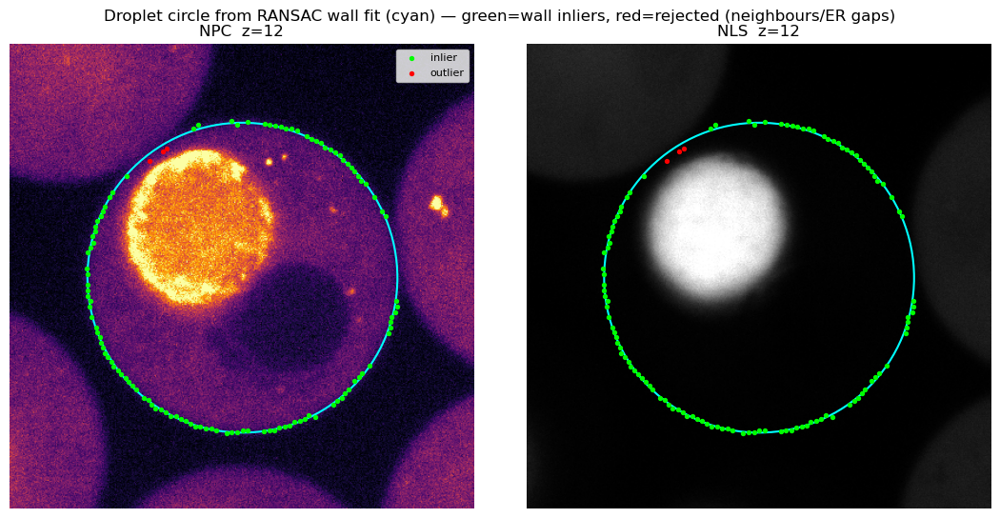

In [47]:
# ============================================================
# Droplet geometry via multi-plane detection + DBSCAN linking
# + RANSAC circle fit.  Standalone test cell — does NOT touch
# existing segmentation functions.
#
# Rationale: the droplet is a sphere. Its cleanest cross-section
# for DETECTION (separated neighbours, uniform interior) is not
# the nucleus best-Z. So detect where clean, link the same
# physical droplet across Z by clustering centres (drift-tolerant),
# then recover the droplet extent at ANY target plane (e.g. the
# nucleus plane) by fitting a circle to the wall — robust to
# interior ER heterogeneity and to arcs occluded by touching
# neighbours.
#
# Geometry-only: NPC pixel values are clipped/smoothed freely here.
# NPC puncta detection must still run separately on the RAW plane.
# ============================================================
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from scipy import ndimage
from skimage import filters

PIXEL_SIZE_UM = 0.169
# ── Circle fitting ─────────────────────────────────────────────
def _circle_from_3(p1, p2, p3):
    """Exact circumcircle of three (x, y) points, or None if collinear."""
    ax, ay = p1; bx, by = p2; cx, cy = p3
    d = 2.0 * (ax * (by - cy) + bx * (cy - ay) + cx * (ay - by))
    if abs(d) < 1e-9:
        return None
    a2, b2, c2 = ax*ax + ay*ay, bx*bx + by*by, cx*cx + cy*cy
    ux = (a2 * (by - cy) + b2 * (cy - ay) + c2 * (ay - by)) / d
    uy = (a2 * (cx - bx) + b2 * (ax - cx) + c2 * (bx - ax)) / d
    return ux, uy, float(np.hypot(ux - ax, uy - ay))


def _fit_circle_kasa(pts):
    """Algebraic least-squares circle fit (Kåsa) to Nx2 (x, y) points."""
    x, y = pts[:, 0], pts[:, 1]
    A = np.c_[x, y, np.ones(len(x))]
    b = x * x + y * y
    sol, *_ = np.linalg.lstsq(A, b, rcond=None)
    cx, cy = sol[0] / 2.0, sol[1] / 2.0
    r = np.sqrt(max(sol[2] + cx * cx + cy * cy, 0.0))
    return cx, cy, r


def fit_circle_ransac(pts, tol_px=4.0, n_iter=300, min_inlier_frac=0.5, rng=None):
    """
    RANSAC circle fit to Nx2 (x, y) points. Returns (cx, cy, r, inlier_mask)
    or None. Tolerant of arcs missing (touching neighbours) and stray points.
    """
    rng = rng or np.random.default_rng(0)
    n = len(pts)
    if n < 3:
        return None
    best_inliers, best_circle = None, None
    for _ in range(n_iter):
        idx = rng.choice(n, 3, replace=False)
        circ = _circle_from_3(pts[idx[0]], pts[idx[1]], pts[idx[2]])
        if circ is None:
            continue
        cx, cy, r = circ
        resid = np.abs(np.hypot(pts[:, 0] - cx, pts[:, 1] - cy) - r)
        inliers = resid < tol_px
        if best_inliers is None or inliers.sum() > best_inliers.sum():
            best_inliers, best_circle = inliers, circ
    if best_inliers is None or best_inliers.sum() < max(3, int(min_inlier_frac * n)):
        return None
    cx, cy, r = _fit_circle_kasa(pts[best_inliers])     # refit on inliers
    resid = np.abs(np.hypot(pts[:, 0] - cx, pts[:, 1] - cy) - r)
    return cx, cy, r, resid < tol_px


# ── Multi-plane detection + linking ────────────────────────────
def detect_droplets_multiplane(hyperstack, t, z_range, **ws_kwargs):
    """
    Run the watershed detector on every z in z_range. Returns a flat list of
    detections: dicts with z, x, y (centre), r (from area), area, circ.
    Only droplets passing the detector's own circularity/area gates appear,
    so merged/touching cross-sections are naturally excluded ("clean planes").
    """
    dets = []
    for z in z_range:
        npc = extract_plane(hyperstack, t, z, CH_NPC)
        for d in detect_droplets_npc_watershed(npc, **ws_kwargs):
            cy, cx = d["centroid"]                       # stored as (row, col)
            dets.append({
                "z": int(z), "x": float(cx), "y": float(cy),
                "r": float(np.sqrt(d["area"] / np.pi)),
                "area": int(d["area"]), "circ": float(d["circ"]),
            })
    return dets


def link_droplets_dbscan(dets, pixel_size_um=PIXEL_SIZE_UM,
                         drift_tolerance_um=10.0, min_planes=2):
    """
    Cluster detections by (x, y) centre across all z with DBSCAN. eps is the
    drift tolerance in microns converted to pixels. Each cluster is one
    physical droplet tracked through z (drift-tolerant via DBSCAN chaining).
    Returns list of tracks; each track is a list of detection dicts sorted by z.
    """
    if not dets:
        return []
    xy = np.array([[d["x"], d["y"]] for d in dets])
    eps_px = drift_tolerance_um / pixel_size_um
    labels = DBSCAN(eps=eps_px, min_samples=min_planes).fit_predict(xy)
    tracks = []
    for lab in sorted(set(labels)):
        if lab == -1:                                    # DBSCAN noise
            continue
        members = [dets[i] for i in range(len(dets)) if labels[i] == lab]
        members.sort(key=lambda d: d["z"])
        tracks.append(members)
    return tracks


# ── Wall extraction at an arbitrary plane ──────────────────────
def extract_wall_points_radial(npc_plane, center_xy, r_prior,
                               n_rays=180, r_lo_frac=0.55, r_hi_frac=1.45,
                               smooth_sigma=2.0,
                               clip_lo=NPC_CLIP_LO_PCT, clip_hi=NPC_CLIP_HI_PCT,
                               strength_pct=35.0):
    """
    Cast n_rays from center_xy and locate the droplet wall on each as the
    steepest interior->exterior intensity fall within [r_lo, r_hi]*r_prior.
    Rays through touching neighbours (no clean fall) yield weak edges and are
    dropped by the strength percentile filter. Returns Nx2 (x, y) wall points.
    Geometry-only: clips + smooths the NPC plane.
    """
    cx, cy = center_xy
    H, W = npc_plane.shape
    img = filters.gaussian(clip_histogram(npc_plane, clip_lo, clip_hi), smooth_sigma)
    radii = np.arange(r_prior * r_lo_frac, r_prior * r_hi_frac, 1.0)
    pts, strengths = [], []
    for theta in np.linspace(0, 2 * np.pi, n_rays, endpoint=False):
        dx, dy = np.cos(theta), np.sin(theta)
        xs, ys = cx + radii * dx, cy + radii * dy
        ok = (xs >= 0) & (xs < W) & (ys >= 0) & (ys < H)
        if ok.sum() < 5:
            continue
        prof = ndimage.map_coordinates(img, [ys[ok], xs[ok]], order=1)
        grad = np.gradient(prof)
        j = int(np.argmin(grad))                         # steepest fall = wall
        edge_r = radii[ok][j]
        pts.append((cx + edge_r * dx, cy + edge_r * dy))
        strengths.append(-grad[j])
    if not pts:
        return np.empty((0, 2))
    pts, strengths = np.array(pts), np.array(strengths)
    keep = strengths >= np.percentile(strengths, strength_pct)
    return pts[keep]


def fit_droplet_circle_at_plane(hyperstack, t, z_target, seed_center_xy, r_prior,
                                tol_px=4.0, **wall_kwargs):
    """
    Recover the droplet circle at z_target: extract wall points seeded from a
    (linked) centre estimate, then RANSAC-fit a circle. Returns
    (cx, cy, r, wall_pts, inlier_mask) or None.
    """
    npc = extract_plane(hyperstack, t, z_target, CH_NPC)
    wall = extract_wall_points_radial(npc, seed_center_xy, r_prior, **wall_kwargs)
    if len(wall) < 3:
        return None
    fit = fit_circle_ransac(wall, tol_px=tol_px)
    if fit is None:
        return None
    cx, cy, r, inliers = fit
    return cx, cy, r, wall, inliers


# ── Runner + visualization ─────────────────────────────────────
_t            = 9
_z_detect     = range(7, 17)     # planes to search for clean detections
_z_nucleus    = 12              # target plane (nucleus best-Z)
_drift_um     = 10.0             # DBSCAN eps in microns
_target_rc    = _target["centroid"]   # (row, col) of the droplet from before

# 1. detect across planes, 2. link into drift-tolerant tracks
_dets   = detect_droplets_multiplane(hyperstack, _t, _z_detect,
                                      closing_radius_px=12, h_depth=15.0)
_tracks = link_droplets_dbscan(_dets, drift_tolerance_um=_drift_um, min_planes=2)
print(f"t={_t}: {len(_dets)} detections across z{_z_detect.start}-{_z_detect.stop-1} "
      f"-> {len(_tracks)} linked droplets")

# 3. pick the track matching the previously-targeted droplet (nearest centre)
_tx, _ty = _target_rc[1], _target_rc[0]
def _track_center(tr):
    return np.mean([d["x"] for d in tr]), np.mean([d["y"] for d in tr])
_track = min(_tracks, key=lambda tr: np.hypot(_track_center(tr)[0]-_tx,
                                              _track_center(tr)[1]-_ty))
_zs = [d["z"] for d in _track]
print(f"target track: {len(_track)} planes (z={_zs}), "
      f"centre~({_track_center(_track)[0]:.0f},{_track_center(_track)[1]:.0f})")

# 4. seed from the detected plane nearest the nucleus plane, fit circle there
_near = min(_track, key=lambda d: abs(d["z"] - _z_nucleus))
_fit = fit_droplet_circle_at_plane(hyperstack, _t, _z_nucleus,
                                   (_near["x"], _near["y"]), _near["r"])

if _fit is None:
    print("Circle fit failed at nucleus plane — check seed/r_prior or widen rays.")
else:
    _cx, _cy, _r, _wall, _in = _fit
    print(f"fitted droplet @ z={_z_nucleus}: centre=({_cx:.0f},{_cy:.0f}) r={_r:.0f}px "
          f"({_r*PIXEL_SIZE_UM:.1f}µm)  inliers={_in.sum()}/{len(_wall)}")
    _pad = int(1.5 * _r)
    _r0, _c0 = max(int(_cy-_pad),0), max(int(_cx-_pad),0)
    _r1, _c1 = int(_cy+_pad), int(_cx+_pad)
    _npc = extract_plane(hyperstack, _t, _z_nucleus, CH_NPC)[_r0:_r1, _c0:_c1]
    _nls = extract_plane(hyperstack, _t, _z_nucleus, CH_NLS)[_r0:_r1, _c0:_c1]
    fig, ax = plt.subplots(1, 2, figsize=(11, 5.5))
    for a, img, ttl in ((ax[0], _npc, "NPC"), (ax[1], _nls, "NLS")):
        a.imshow(_norm(img), cmap="inferno" if ttl == "NPC" else "gray")
        a.add_patch(plt.Circle((_cx-_c0, _cy-_r0), _r, fill=False,
                               color="cyan", lw=1.5))
        a.scatter(_wall[_in,0]-_c0, _wall[_in,1]-_r0, s=8, c="lime", label="inlier")
        a.scatter(_wall[~_in,0]-_c0, _wall[~_in,1]-_r0, s=8, c="red", label="outlier")
        a.set_title(f"{ttl}  z={_z_nucleus}"); a.axis("off")
    ax[0].legend(loc="upper right", fontsize=8)
    plt.suptitle("Droplet circle from RANSAC wall fit (cyan) — "
                 "green=wall inliers, red=rejected (neighbours/ER gaps)")
    plt.tight_layout(); plt.show()

---
## Stage 3 — NPC puncta label verification

Confirm NPC labels lie on the envelope ring — not deep inside the nucleus (antibody artifact) and not at the droplet wall (v6-era error). Uses the **raw** NPC plane.

In [25]:
def verify_npc_labels(hyperstack, t: int, z: int, n_droplets: int = 5) -> None:
    """STAGE 3 — per sampled droplet: raw NPC / nucleus anchor / annular zone / puncta / overlay."""
    npc = extract_plane(hyperstack, t, z, CH_NPC)   # RAW
    nls = extract_plane(hyperstack, t, z, CH_NLS)
    droplets = [d for d in detect_droplets_npc_watershed(npc)]
    if not droplets:
        print(f"No droplets at t={t}, z={z}."); return

    # prefer droplets that actually have a nucleus to anchor to
    with_nuc = []
    for d in droplets:
        r0, c0, r1, c1 = d["bbox"]
        nuc, _ = detect_nucleus_adaptive(nls[r0:r1, c0:c1], d["mask"][r0:r1, c0:c1])
        if nuc.sum() > 0:
            with_nuc.append((d, nuc))
    if not with_nuc:
        print(f"No nucleated droplets at t={t}, z={z} — try a later timepoint."); return

    sample = [with_nuc[i] for i in rng.choice(len(with_nuc), size=min(n_droplets, len(with_nuc)), replace=False)]

    fig, ax = plt.subplots(len(sample), 5, figsize=(20, 4 * len(sample)))
    if len(sample) == 1:
        ax = ax[None, :]
    selem = morphology.disk(NPC_MARGIN_PX)
    for i, (d, nuc) in enumerate(sample):
        r0, c0, r1, c1 = d["bbox"]
        dm   = d["mask"][r0:r1, c0:c1]
        npcc = npc[r0:r1, c0:c1]
        zone = morphology.binary_dilation(nuc, selem) & ~morphology.binary_erosion(nuc, selem)
        puncta = detect_npc_puncta(npcc, nuc, dm)

        ax[i, 0].imshow(_norm(npcc), cmap="gray");      ax[i, 0].set_title("Raw NPC crop")
        ax[i, 1].imshow(nuc, cmap="gray");              ax[i, 1].set_title("Nucleus anchor")
        ax[i, 2].imshow(zone, cmap="gray");             ax[i, 2].set_title(f"Annular zone ±{NPC_MARGIN_PX}px")
        ax[i, 3].imshow(puncta, cmap="gray");           ax[i, 3].set_title(f"NPC puncta ({int(puncta.sum())}px)")
        ax[i, 4].imshow(_norm(npcc), cmap="gray")
        ax[i, 4].imshow(np.ma.masked_where(~puncta, puncta), cmap="spring", alpha=0.9)
        ax[i, 4].set_title("Overlay")
        for a in ax[i]:
            a.axis("off")
    plt.tight_layout(); plt.show()

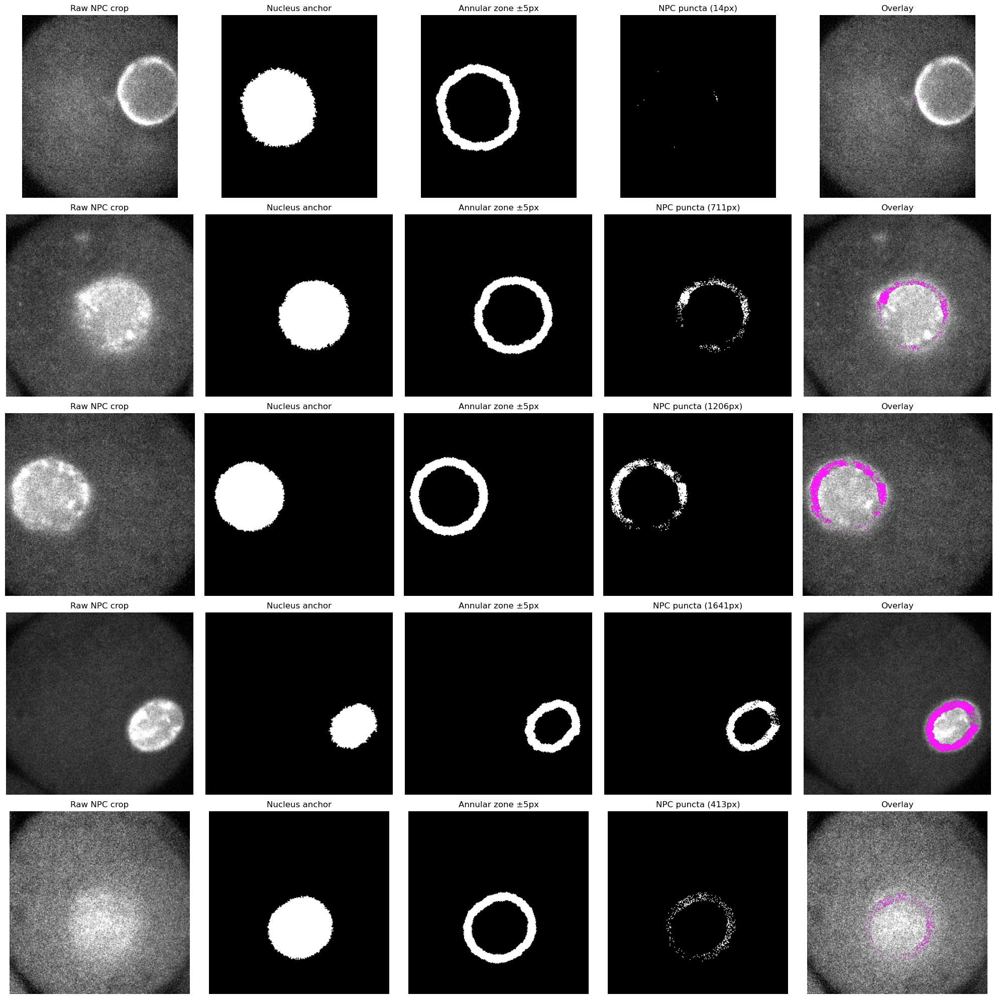

In [26]:
# ── Stage 3 Runner ─────────────────────────────────────────────────────────────
verify_npc_labels(hyperstack, t=5, z=8, n_droplets=5)   # avoid t=0–1 (NLS too faint)

---
## Stage 4 — Nucleus threshold sweep

Adaptive + Otsu fallback across the whole timecourse. Expected: more `none`/Otsu at early timepoints (faint, unsealed), stable larger nuclei late. The summary flags empty and runaway detections; the gallery shows every flagged droplet.

In [48]:
def nucleus_threshold_sweep(hyperstack, t_range: list[int], z: int) -> None:
    """STAGE 4 — per-timepoint method mix + area fractions, plus a flagged-droplet gallery."""
    rows, flagged = [], []
    for t in t_range:
        nls = extract_plane(hyperstack, t, z, CH_NLS)
        npc = extract_plane(hyperstack, t, z, CH_NPC)
        droplets = detect_droplets_npc_watershed(npc)
        methods = {"adaptive": 0, "otsu": 0, "none": 0}
        fracs = []
        for d in droplets:
            r0, c0, r1, c1 = d["bbox"]
            dm = d["mask"][r0:r1, c0:c1]
            nuc, method = detect_nucleus_adaptive(nls[r0:r1, c0:c1], dm)
            methods[method] += 1
            frac = nuc.sum() / max(1, dm.sum())
            fracs.append(frac)
            # flag only implausible *positive* detections (none is expected early)
            if method != "none" and (frac >= NUCLEUS_MAX_FRACTION * 0.95):
                flagged.append((t, nls[r0:r1, c0:c1].copy(), nuc.copy(), method, frac))
        rows.append((t, len(droplets), methods, float(np.mean(fracs)) if fracs else 0.0))

    ts = [r[0] for r in rows]
    fig, ax = plt.subplots(1, 2, figsize=(15, 4))
    width = 0.6
    adapt = [r[2]["adaptive"] for r in rows]
    otsu  = [r[2]["otsu"] for r in rows]
    none_ = [r[2]["none"] for r in rows]
    ax[0].bar(ts, adapt, width, label="adaptive")
    ax[0].bar(ts, otsu, width, bottom=adapt, label="otsu")
    ax[0].bar(ts, none_, width, bottom=[a + o for a, o in zip(adapt, otsu)], label="none")
    ax[0].set_xlabel("timepoint"); ax[0].set_ylabel("droplets"); ax[0].set_title("Nucleus method mix"); ax[0].legend()
    ax[1].plot(ts, [r[3] for r in rows], "o-")
    ax[1].axhline(NUCLEUS_MAX_FRACTION, color="r", ls="--", label="max gate")
    ax[1].set_xlabel("timepoint"); ax[1].set_ylabel("mean nucleus/droplet fraction")
    ax[1].set_title("Mean nucleus area fraction"); ax[1].legend()
    plt.tight_layout(); plt.show()

    print("t  ndroplets  adaptive/otsu/none  mean_frac")
    for t, n, m, f in rows:
        print(f"{t:>2}  {n:>8}   {m['adaptive']}/{m['otsu']}/{m['none']:<6}  {f:.3f}")

    if flagged:
        k = min(len(flagged), 8)
        fig, ax = plt.subplots(2, k, figsize=(3 * k, 6))
        if k == 1:
            ax = ax[:, None]
        for j in range(k):
            t, crop, nuc, method, frac = flagged[j]
            ax[0, j].imshow(_norm(crop), cmap="gray"); ax[0, j].set_title(f"t={t} {method}\nfrac={frac:.2f}")
            ax[1, j].imshow(nuc, cmap="gray")
            ax[0, j].axis("off"); ax[1, j].axis("off")
        plt.suptitle("Flagged: implausibly large nucleus detections"); plt.tight_layout(); plt.show()
    else:
        print("\nNo runaway nucleus detections flagged.")

In [ ]:
# ── Stage 4 Runner ─────────────────────────────────────────────────────────────
nucleus_threshold_sweep(hyperstack, t_range=list(range(0, T)), z=8)

---
## Stage 5 — Patch generation with inline QC

> **Only run after Stages 1–4 pass visual inspection.**

For every valid `(t, z)`: full pipeline → `(4, H, W)` label stack → patches centred on each droplet centroid, saved as `.npz` (input `(3,H,W)` float32 + label `(4,H,W)` uint8). A random `N_PREVIEW` sample is shown after generation.

Also writes a **binary nucleus-mask hyperstack TIFF** (`(T, Z, Y, X)` uint8) of all detected nuclei — for ROI generation applied back to the original images for quantification (not for direct measurement), per the standard pipeline output.

In [ ]:
def _safe_crop(arr, cy, cx, size):
    """Centred crop with zero-padding when the window exceeds the image."""
    half = size // 2
    H, W = arr.shape[-2:]
    r0, c0 = int(round(cy)) - half, int(round(cx)) - half
    r1, c1 = r0 + size, c0 + size
    pr0, pc0 = max(0, -r0), max(0, -c0)
    sr0, sc0 = max(0, r0), max(0, c0)
    sr1, sc1 = min(H, r1), min(W, c1)
    if arr.ndim == 2:
        out = np.zeros((size, size), dtype=arr.dtype)
        out[pr0:pr0 + (sr1 - sr0), pc0:pc0 + (sc1 - sc0)] = arr[sr0:sr1, sc0:sc1]
    else:
        out = np.zeros((arr.shape[0], size, size), dtype=arr.dtype)
        out[:, pr0:pr0 + (sr1 - sr0), pc0:pc0 + (sc1 - sc0)] = arr[:, sr0:sr1, sc0:sc1]
    return out


def generate_patches_with_qc(hyperstack, t_range, z_range,
                             patch_size=PATCH_SIZE, output_dir=str(OUTPUT_DIR),
                             n_preview=N_PREVIEW) -> None:
    """STAGE 5 — generate patch pairs + nucleus-mask hyperstack TIFF, then preview."""
    out = Path(output_dir); out.mkdir(parents=True, exist_ok=True)
    T_, Z_, _, Y_, X_ = hyperstack.shape
    nucleus_hyperstack = np.zeros((T_, Z_, Y_, X_), dtype=np.uint8)
    saved = []

    for t in t_range:
        for z in z_range:
            nls = extract_plane(hyperstack, t, z, CH_NLS)
            npc = extract_plane(hyperstack, t, z, CH_NPC)   # raw, re-pulled
            mem = extract_plane(hyperstack, t, z, CH_MEMBRANE)
            droplets = detect_droplets_npc_watershed(npc)
            if not droplets:
                continue

            nuc_masks, npc_masks = [], []
            for d in droplets:
                r0, c0, r1, c1 = d["bbox"]
                dm = d["mask"][r0:r1, c0:c1]
                nuc, _ = detect_nucleus_adaptive(nls[r0:r1, c0:c1], dm)
                pun = detect_npc_puncta(npc[r0:r1, c0:c1], nuc, dm)
                nuc_masks.append(nuc); npc_masks.append(pun)

            stack = build_label_stack(nls.shape, droplets, nuc_masks, npc_masks)
            nucleus_hyperstack[t, z] = stack[CLASS_NUCLEUS]   # accumulate for TIFF

            inp = np.stack([nls, npc, mem]).astype(np.float32)
            for di, d in enumerate(droplets):
                cy, cx = d["centroid"]
                ip = _safe_crop(inp, cy, cx, patch_size)
                lp = _safe_crop(stack, cy, cx, patch_size)
                fn = out / f"patch_t{t:02d}_z{z:02d}_d{di:04d}.npz"
                np.savez_compressed(fn, input=ip, label=lp)
                saved.append(fn)

    tiff_path = out / "nucleus_mask_hyperstack.tif"
    tifffile.imwrite(str(tiff_path), nucleus_hyperstack,
                     imagej=True, metadata={"axes": "TZYX"})
    print(f"Saved {len(saved)} patches → {out}")
    print(f"Saved nucleus-mask hyperstack → {tiff_path}  shape={nucleus_hyperstack.shape}")

    if not saved:
        return
    pick = [saved[i] for i in rng.choice(len(saved), size=min(n_preview, len(saved)), replace=False)]
    fig, ax = plt.subplots(2, len(pick), figsize=(3 * len(pick), 6))
    if len(pick) == 1:
        ax = ax[:, None]
    for j, fn in enumerate(pick):
        dat = np.load(fn)
        ip, lp = dat["input"], dat["label"]
        ax[0, j].imshow(_norm(ip[0]), cmap="gray"); ax[0, j].set_title(fn.name.replace("patch_", ""), fontsize=7)
        ax[1, j].imshow(collapse_to_integer(lp), cmap=_LABEL_CMAP, vmin=0, vmax=3)
        ax[0, j].axis("off"); ax[1, j].axis("off")
    plt.suptitle("Patch QC: NLS input (top) · 4-class label (bottom)"); plt.tight_layout(); plt.show()

In [ ]:
# ── Stage 5 Runner ─────────────────────────────────────────────────────────────
# Run ONLY after Stages 1–4 look correct.
generate_patches_with_qc(
    hyperstack,
    t_range=list(range(0, T)),
    z_range=list(range(Z_FLOOR, Z)),
    patch_size=PATCH_SIZE,
    output_dir=str(OUTPUT_DIR),
    n_preview=N_PREVIEW,
)